In [2]:
import requests
from bs4 import BeautifulSoup
import csv
import pandas as pd
import numpy as np
import time
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.dates as mdates

Các hướng tiếp cận
- Dự đoán bất thường 

In [3]:

# cities = {
#     # ===== MIỀN BẮC (6 tỉnh) =====
#     "Hanoi": (21.0278, 105.8342),
#     "Thai Nguyen": (21.5671, 105.8252),      # ⭐ MỚI - Trung du miền núi
#     "Vinh Phuc": (21.3609, 105.5474),        # ⭐ MỚI - Vùng đồng bằng
#     "Quang Ninh": (21.0064, 107.2925),       # ⭐ MỚI - Hạ Long, vùng biển
    
#     # ===== MIỀN TRUNG (6 tỉnh) =====
#     "Da Nang": (16.0544, 108.2022),
#     "Hue": (16.4637, 107.5909),
#     "Quang Nam": (15.5394, 108.0191),        # ⭐ MỚI - Hội An, Tam Kỳ
#     "Khanh Hoa": (12.2585, 109.0526),        # ⭐ MỚI - Nha Trang, du lịch biển
    
#     # ===== MIỀN NAM (6 tỉnh) =====
#     "Ho Chi Minh": (10.7769, 106.7009),
#     "Dong Nai": (10.9465, 106.8340),         # ⭐ MỚI - Biên Hòa, công nghiệp
#     "Ba Ria Vung Tau": (10.5417, 107.2429),  # ⭐ MỚI - Vũng Tàu, biển
#     "Long An": (10.5336, 106.4110),          # ⭐ MỚI - Tân An, đồng bằng sông Cửu Long
# }

# start_date = "2022-01-01"
# end_date   = "2024-12-31"

# # Các biến có sẵn trong Archive API
# daily_vars = [
#     "temperature_2m_max",
#     "temperature_2m_min", 
#     "temperature_2m_mean",
#     "rain_sum",
#     "precipitation_hours",
#     "weather_code",
#     "sunrise",
#     "sunset",
#     "sunshine_duration",
#     "daylight_duration",  
#     "wind_speed_10m_max",
#     "wind_speed_10m_mean",
#     "wind_gusts_10m_max",
#     "wind_direction_10m_dominant",
#     "shortwave_radiation_sum",
# ]

# records = []

# for city, (lat, lon) in cities.items():
#     url = (
#         "https://archive-api.open-meteo.com/v1/archive?"  # Đúng endpoint
#         f"latitude={lat}&longitude={lon}"
#         f"&start_date={start_date}&end_date={end_date}"
#         f"&daily={','.join(daily_vars)}"
#         "&timezone=Asia/Bangkok"  # Timezone rõ ràng
#     )

#     try:
#         print(f"🔄 Đang lấy dữ liệu cho {city}...")
#         res = requests.get(url, timeout=30).json()
        
#         if "daily" in res:
#             daily = res["daily"]
#             for i in range(len(daily["time"])):
#                 record = {"city": city, "latitude": lat, "longitude": lon, "date": daily["time"][i]}
#                 for var in daily_vars:
#                     record[var] = daily.get(var, [None]*len(daily["time"]))[i]
#                 records.append(record)
#             print(f"✅ {city}: {len(daily['time'])} ngày")
#         else:
#             print(f"⚠️ {city}: {res.get('reason', res)}")
            
#         time.sleep(0.5)  # Tránh spam API
        
#     except Exception as e:
#         print(f"❌ Lỗi {city}: {e}")
        
#     time.sleep(10)

# df_daily = pd.DataFrame(records)
# # df = pd.DataFrame(records)
# # print(f"\n{'='*60}")
# # print(f"Tổng số record: {len(df)}")
# # print(f"\nMẫu dữ liệu:")
# # print(df.head(10))

# # if len(df) > 0:
# #     df.to_csv("vietnam_weather_2023_archive.csv", index=False, encoding="utf-8")
# #     print("\n✅ Đã lưu file thành công!")

In [4]:
# hourly_vars = [
#     "relative_humidity_2m",   # Độ ẩm
#     "dewpoint_2m",            # Điểm sương
#     "surface_pressure",       # Áp suất
#     "cloudcover",             # Mây
# ]

# hourly_records = []

# print("\n" + "=" * 70)
# print("📊 BƯỚC 2: Lấy dữ liệu HOURLY (để tính daily)")
# print("=" * 70)

# for city, (lat, lon) in cities.items():
#     url = (
#         "https://archive-api.open-meteo.com/v1/archive?"
#         f"latitude={lat}&longitude={lon}"
#         f"&start_date={start_date}&end_date={end_date}"
#         f"&hourly={','.join(hourly_vars)}"
#         "&timezone=Asia/Bangkok"
#     )
    
#     try:
#         print(f"🔄 {city}...", end=" ")
#         res = requests.get(url, timeout=30).json()
        
#         if "hourly" in res:
#             hourly = res["hourly"]
#             for i in range(len(hourly["time"])):
#                 record = {
#                     "city": city, 
#                     "datetime": hourly["time"][i],
#                 }
#                 for var in hourly_vars:
#                     record[var] = hourly.get(var, [None]*len(hourly["time"]))[i]
#                 hourly_records.append(record)
#             print(f"✅ {len(hourly['time'])} giờ")
#         else:
#             print(f"⚠️ Lỗi: {res.get('reason', 'Unknown')}")
        
#         time.sleep(2)
#     except Exception as e:
#         print(f"❌ Lỗi: {e}")

# df_hourly = pd.DataFrame(hourly_records)

# # ========================================
# # BƯỚC 3: Tính toán Daily từ Hourly
# # ========================================
# print("\n" + "=" * 70)
# print("📊 BƯỚC 3: Tính toán Daily từ Hourly")
# print("=" * 70)

# if len(df_hourly) > 0:
#     # Tạo cột date từ datetime
#     df_hourly['date'] = pd.to_datetime(df_hourly['datetime']).dt.date
#     df_hourly['date'] = df_hourly['date'].astype(str)
    
#     # Tính toán các chỉ số daily
#     df_hourly_agg = df_hourly.groupby(['city', 'date']).agg({
#         'relative_humidity_2m': ['max', 'min', 'mean'],
#         'dewpoint_2m': ['max', 'min', 'mean'],
#         'surface_pressure': 'mean',
#         'cloudcover': 'mean',
#     }).reset_index()
    
#     # Làm phẳng tên cột
#     df_hourly_agg.columns = [
#         'city', 'date',
#         'relative_humidity_2m_max', 'relative_humidity_2m_min', 'relative_humidity_2m_mean',
#         'dewpoint_2m_max', 'dewpoint_2m_min', 'dewpoint_2m_mean',
#         'surface_pressure_mean',
#         'cloudcover_mean',
#     ]
    
#     print(f"✅ Đã tính toán xong {len(df_hourly_agg)} dòng daily từ hourly")
    
#     # ========================================
#     # BƯỚC 4: Merge 2 DataFrame
#     # ========================================
#     print("\n" + "=" * 70)
#     print("📊 BƯỚC 4: Gộp dữ liệu Daily + Hourly aggregated")
#     print("=" * 70)
    
#     df_final = df_daily.merge(
#         df_hourly_agg, 
#         on=['city', 'date'], 
#         how='left'
#     )
    
#     print(f"✅ Tổng số record: {len(df_final)}")
#     print(f"✅ Tổng số cột: {len(df_final.columns)}")
    
#     # ========================================
#     # BƯỚC 5: Lưu file
#     # ========================================
#     print("\n" + "=" * 70)
#     print("💾 Lưu file CSV")
#     print("=" * 70)
    
#     df_final.to_csv("vietnam_weather_2023_complete.csv", index=False, encoding="utf-8")
#     print("✅ Đã lưu: vietnam_weather_2023_complete.csv")
    
#     # Hiển thị thông tin
#     print(f"\n📋 Các cột trong file:")
#     for i, col in enumerate(df_final.columns, 1):
#         print(f"  {i:2d}. {col}")
    
#     print(f"\n🔍 Mẫu dữ liệu (5 dòng đầu):")
#     print(df_final.head())
    
#     print(f"\n📊 Thống kê missing values:")
#     missing = df_final.isnull().sum()
#     missing = missing[missing > 0].sort_values(ascending=False)
#     if len(missing) > 0:
#         print(missing)
#     else:
#         print("✅ Không có giá trị thiếu!")
        
# else:
#     print("⚠️ Không có dữ liệu hourly để xử lý")
#     df_final = df_daily
#     df_final.to_csv("vietnam_weather_2023_complete.csv", index=False, encoding="utf-8")

In [5]:
path = "vietnam_weather_2023_complete.csv"
df = pd.read_csv(path)
df['date'] = pd.to_datetime(df['date'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13152 entries, 0 to 13151
Data columns (total 27 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   city                         13152 non-null  object        
 1   latitude                     13152 non-null  float64       
 2   longitude                    13152 non-null  float64       
 3   date                         13152 non-null  datetime64[ns]
 4   temperature_2m_max           13152 non-null  float64       
 5   temperature_2m_min           13152 non-null  float64       
 6   temperature_2m_mean          13152 non-null  float64       
 7   rain_sum                     13152 non-null  float64       
 8   precipitation_hours          13152 non-null  float64       
 9   weather_code                 13152 non-null  int64         
 10  sunrise                      13152 non-null  object        
 11  sunset                       13152 non-nu

- temperature_2m_max :
Nhiệt độ tối đa trong ngày (°C)
Đo ở độ cao 2m so với mặt đất
Thường xảy ra vào buổi chiều (14h-16h)

- temperature_2m_min
Nhiệt độ tối thiểu trong ngày (°C)
Thường xảy ra vào sáng sớm (5h-7h)

- temperature_2m_mean:
Nhiệt độ trung bình trong ngày (°C)
Trung bình của 24 giá trị hàng giờ


- precipitation_hour:
Tổng lượng mưa (tính theo giờ) trong một ngày 

- rain_sum
Chỉ tính lượng mưa (mm)
Không bao gồm tuyết

- weather_code: 


- wind_speed_10m_max
Tốc độ gió tối đa trong ngày (km/h hoặc m/s)
Đo ở độ cao 10m
Gió liên tục (sustained wind)

- wind_gusts_10m_max
Tốc độ giật gió tối đa (km/h hoặc m/s)
Đợt gió mạnh đột ngột, ngắn (< 20 giây)
Thường cao hơn wind_speed_max 30-50%
Quan trọng cho cảnh báo bão, giông

- wind_direction_10m_dominant (độ, 0-360°)
Hướng gió chủ đạo trong ngày
Quy ước:
0° / 360° = Gió Bắc
90° = Gió Đông
180° = Gió Nam
270° = Gió Tây
Ví dụ: 135° = Gió Đông Nam

- weather_code (WMO code)
Mã phân loại thời tiết theo chuẩn WMO (Tổ chức Khí tượng Thế giới)
Các giá trị phổ biến:
0 = Trời quang đãng
1, 2, 3 = Có mây (ít, vừa, nhiều)
45, 48 = Sương mù
51, 53, 55 = Mưa phùn (nhẹ, vừa, dày đặc)
61, 63, 65 = Mưa (nhẹ, vừa, to)
71, 73, 75 = Tuyết rơi (nhẹ, vừa, dày)
80, 81, 82 = Mưa rào (nhẹ, vừa, mạnh)
95 = Giông bão
96, 99 = Giông có mưa đá

- Relative Humidity min/max/mean: Độ ẩm không khí trong ngày 

- Dewpoint min/max/mean: 
Điểm sương 
Quy tắc vàng:
Khi dewpoint ≈ temperature (chênh < 2°C) → Sương mù, mưa
Dewpoint cao (> 24°C) → Cảm giác ẩm ướt, ngột ngạt
Ví dụ:
Nhiệt độ 28°C, dewpoint 26°C → Rất ẩm, gần mưa
Nhiệt độ 32°C, dewpoint 15°C → Khô ráo, thoáng
Dùng cho:
Dự báo sương mù (giao thông, hàng không)
Cảnh báo thời tiết nguy hiểm
Comfort index

- surface_pressure_mean 
Áp suất khí quyển tại mặt đất
Đơn vị: hectopascal (hPa) = millibar (mbar)
Giá trị chuẩn: 1013 hPa (ở mực nước biển)
Ý nghĩa:
(>) 1020 hPa = Áp cao (thời tiết đẹp, nắng)
1013 hPa = Bình thường
< 1000 hPa = Áp thấp (mưa, gió)
< 980 hPa = Áp thấp nhiệt đới (nguy hiểm)
< 950 hPa = Bão mạnh (siêu bão)

- cloudcover_mean (%)
Tỷ lệ % bầu trời bị che phủ bởi mây
Phân loại:
0-10% = Quang đãng
10-30% = Ít mây
30-70% = Có mây
70-90% = Nhiều mây
90-100% = U ám, mây dày

- shortwave_radiation_sum
Tổng năng lượng mặt trời chiếu xuống trong ngày (MJ/m²)
Bức xạ sóng ngắn (ánh sáng nhìn thấy + UV)
Dùng cho: dự báo năng lượng mặt trời, nông nghiệp

- et0_fao_evapotranspiration
Lượng nước bốc hơi tiềm năng (mm)
Theo phương pháp FAO Penman-Monteith (tiêu chuẩn quốc tế)
Tổng: bốc hơi từ đất + thoát hơi nước qua lá cây
Dùng trong nông nghiệp: Tính lượng nước cần tưới
Ví dụ: ET0 = 5mm/ngày → cần tưới 5mm nước/ngày

In [6]:
df.head()

,city,latitude,longitude,date,temperature_2m_max,temperature_2m_min,temperature_2m_mean,rain_sum,precipitation_hours,weather_code,...,wind_direction_10m_dominant,shortwave_radiation_sum,relative_humidity_2m_max,relative_humidity_2m_min,relative_humidity_2m_mean,dewpoint_2m_max,dewpoint_2m_min,dewpoint_2m_mean,surface_pressure_mean,cloudcover_mean
0,Hanoi,21.0278,105.8342,2022-01-01,20.7,13.9,16.9,0.0,0.0,3,...,17,6.94,90,58,73.833333,12.8,11.0,12.100000,1022.095833,98.083333
1,Hanoi,21.0278,105.8342,2022-01-02,21.6,14.9,17.2,0.0,0.0,3,...,10,12.63,85,56,70.166667,13.4,10.2,11.554167,1020.462500,55.208333
2,Hanoi,21.0278,105.8342,2022-01-03,21.8,12.9,17.6,0.0,0.0,3,...,130,8.85,100,60,80.375000,14.8,12.9,14.000000,1017.841667,59.125000
3,Hanoi,21.0278,105.8342,2022-01-04,23.9,13.4,18.2,0.0,0.0,3,...,142,9.17,100,57,84.625000,17.2,13.4,15.220833,1015.637500,61.041667
4,Hanoi,21.0278,105.8342,2022-01-05,24.0,17.0,19.8,0.0,0.0,3,...,159,6.89,100,61,84.625000,18.5,16.0,16.933333,1014.058333,74.250000


In [7]:
df['weather_code'].value_counts()

weather_code
51    2960
63    2918
3     2810
53    1396
61    1244
65    1051
55     461
2      111
1      108
0       93
Name: count, dtype: int64

In [8]:
def group_weather_codes(code):
    if code in [0, 1, 2, 3]:
        return 0
    elif code in [45, 48]:
        return 1
    elif code in [51, 53, 55, 61, 63, 65, 80, 81, 82]:
        return 2
    elif code in [95, 96, 99]:
        return 3
    else:
        return 'Other' # Cho các trường hợp khác nếu có

# Tạo một cột mới chứa các nhóm đã được gom lại
df['weather_code'] = df['weather_code'].apply(group_weather_codes)

In [9]:
df['weather_code'].value_counts()

weather_code
2    10030
0     3122
Name: count, dtype: int64

In [10]:
df.isnull().sum()

city                           0
latitude                       0
longitude                      0
date                           0
temperature_2m_max             0
temperature_2m_min             0
temperature_2m_mean            0
rain_sum                       0
precipitation_hours            0
weather_code                   0
sunrise                        0
sunset                         0
sunshine_duration              0
daylight_duration              0
wind_speed_10m_max             0
wind_speed_10m_mean            0
wind_gusts_10m_max             0
wind_direction_10m_dominant    0
shortwave_radiation_sum        0
relative_humidity_2m_max       0
relative_humidity_2m_min       0
relative_humidity_2m_mean      0
dewpoint_2m_max                0
dewpoint_2m_min                0
dewpoint_2m_mean               0
surface_pressure_mean          0
cloudcover_mean                0
dtype: int64

In [11]:
df.describe()

,latitude,longitude,date,temperature_2m_max,temperature_2m_min,temperature_2m_mean,rain_sum,precipitation_hours,weather_code,sunshine_duration,...,wind_direction_10m_dominant,shortwave_radiation_sum,relative_humidity_2m_max,relative_humidity_2m_min,relative_humidity_2m_mean,dewpoint_2m_max,dewpoint_2m_min,dewpoint_2m_mean,surface_pressure_mean,cloudcover_mean
count,13152.000000,13152.000000,13152,13152.000000,13152.000000,13152.000000,13152.000000,13152.000000,13152.000000,13152.000000,...,13152.000000,13152.000000,13152.000000,13152.000000,13152.000000,13152.000000,13152.000000,13152.000000,13152.000000,13152.000000
mean,15.673075,107.046075,2023-07-02 12:00:00,29.744579,22.857641,25.798829,6.423540,6.900091,1.525243,30239.267156,...,159.234109,17.204288,93.993233,63.533531,81.128998,23.377418,20.639340,22.036298,1008.407248,75.864251
min,10.533600,105.547400,2022-01-01 00:00:00,9.400000,6.200000,8.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,1.280000,48.000000,22.000000,33.541667,1.300000,-7.600000,-1.150000,983.370833,0.000000
25%,10.904100,106.266800,2022-10-01 18:00:00,27.700000,21.700000,24.500000,0.100000,1.000000,2.000000,24138.712500,...,89.000000,13.540000,92.000000,55.000000,76.333333,22.100000,19.100000,20.733333,1005.116667,60.041667
50%,15.796900,107.038450,2023-07-02 12:00:00,30.600000,23.900000,26.600000,1.700000,5.000000,2.000000,35922.425000,...,134.000000,18.450000,96.000000,65.000000,83.166667,24.700000,22.300000,23.629167,1008.095833,84.750000
75%,21.011750,107.697950,2024-04-01 06:00:00,32.400000,25.100000,28.000000,8.300000,11.000000,2.000000,39600.000000,...,240.000000,21.770000,98.000000,73.000000,87.416667,25.700000,23.600000,24.596875,1011.379167,97.916667
max,21.567100,109.052600,2024-12-31 00:00:00,42.600000,29.600000,34.400000,269.500000,24.000000,2.000000,43810.510000,...,360.000000,26.990000,100.000000,97.000000,99.250000,29.900000,27.500000,28.058333,1029.275000,100.000000
std,4.432195,1.019781,NaN,4.338965,3.590886,3.648710,11.898623,6.727456,0.850984,13058.848267,...,97.971112,5.748099,6.117238,12.671745,8.617713,3.787314,4.500449,4.105643,5.273824,25.403413


# EDA 

Tách thành phố

In [12]:
cities = ["Hanoi", "Thai Nguyen", "Vinh Phuc", "Quang Ninh",
          "Da Nang", "Hue", "Quang Nam", "Khanh Hoa",
          "Ho Chi Minh", "Dong Nai", "Ba Ria Vung Tau", "Long An"]

north_cities = ["Hanoi", "Thai Nguyen", "Vinh Phuc", "Quang Ninh"]
central_cities = ["Da Nang", "Hue", "Quang Nam", "Khanh Hoa"]
south_cities = ["Ho Chi Minh", "Dong Nai", "Ba Ria Vung Tau", "Long An"]

data_thanhpho = {}
data_vungmien = {}

data_vungmien['North'] = df[df['city'].isin(north_cities)]
data_vungmien['Central'] = df[df['city'].isin(central_cities)]
data_vungmien['South'] = df[df['city'].isin(south_cities)]

for city in cities:
    data_thanhpho[city] = df[df['city'] == city]


In [13]:
data_vungmien['North']["city"] == "Hanoi"

0        True
1        True
2        True
3        True
4        True
        ...  
4379    False
4380    False
4381    False
4382    False
4383    False
Name: city, Length: 4384, dtype: bool

In [14]:
def plot_region_data(region_name, region_array, param_plot, fig=(12, 24)):
    plt.figure(figsize=fig)
    for index, param in enumerate(param_plot):
        plt.subplot(len(param_plot), 1, index + 1)
        for region in region_array:
            data_city = data_vungmien[region_name][data_vungmien[region_name]['city'] == region]
            plt.plot(data_city['date'], data_city[param], label=region)
        plt.title(f"{param}")
        plt.legend()
        plt.xlabel(param)
        plt.ylabel(f"{param} value")
        plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=2))
        plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))
        plt.xticks(rotation=45)
        plt.tight_layout()

### Temperature

1. North City

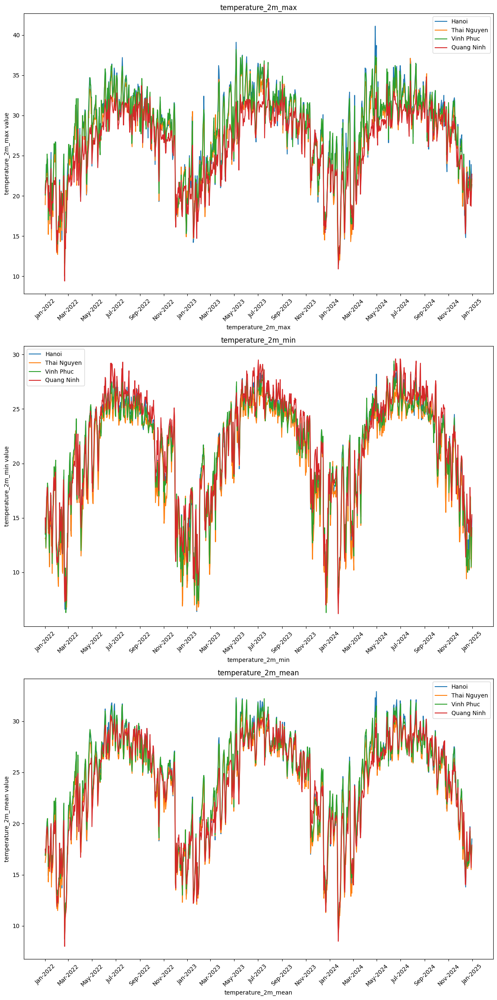

In [15]:
plot_region_data("North", north_cities, ["temperature_2m_max", "temperature_2m_min", "temperature_2m_mean"])

2. Central City 

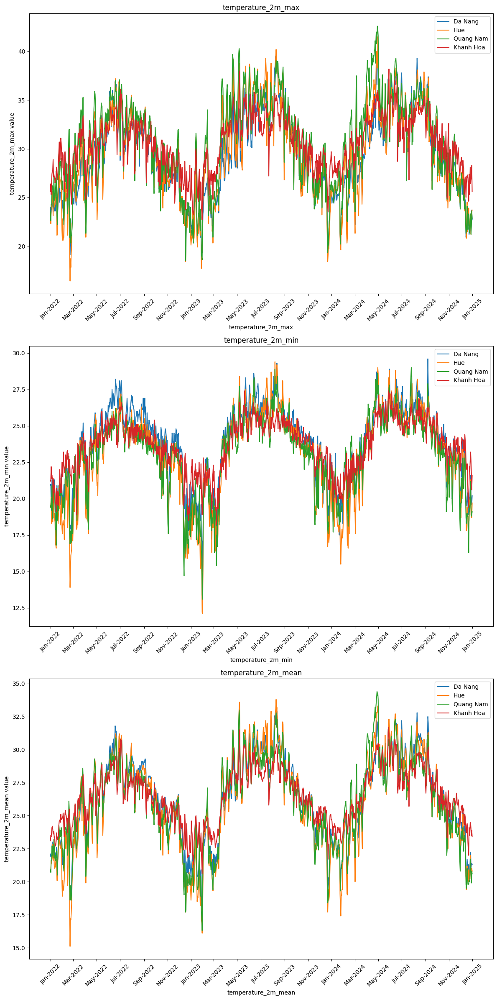

In [16]:
plot_region_data("Central", central_cities, ["temperature_2m_max", "temperature_2m_min", "temperature_2m_mean"])

3. South City

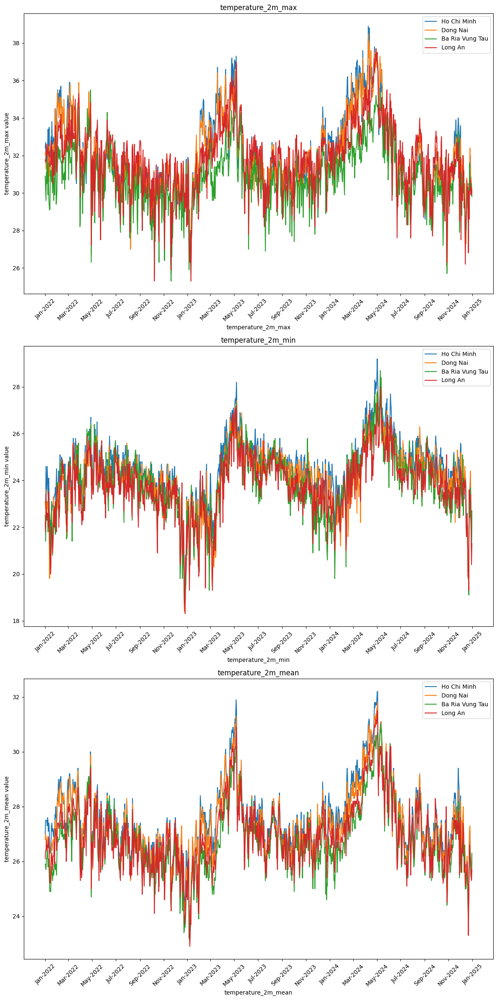

In [17]:
plot_region_data("South", south_cities, ["temperature_2m_max", "temperature_2m_min", "temperature_2m_mean"])

1. North city 

rain sum:
+ Lượng mưa dày đặc vào các tháng 5 - 10
+ Lượng mưa tăng đột biến vào năm 2024 do sự đổ bộ của cơn bão Yagi -> trường hợp đặc biệt có thể note

wind speed:
+ Trải dài đều ở mức 5-20 km/h
+ Có thể thấy ở Quảng Ninh gió to hơn các nơi khác do vùng ven biển     

relative humidity (độ ẩm):
+ Độ ẩm cao ở mức 70-90 ở các tháng mùa mưa
+ Vào các tháng mùa khô 9 - 5 có xu hướng thấp hơn so với mùa mưa

dew_point (điểm sương):
+ Thấp vào mùa khô và cao vào mùa mưa 

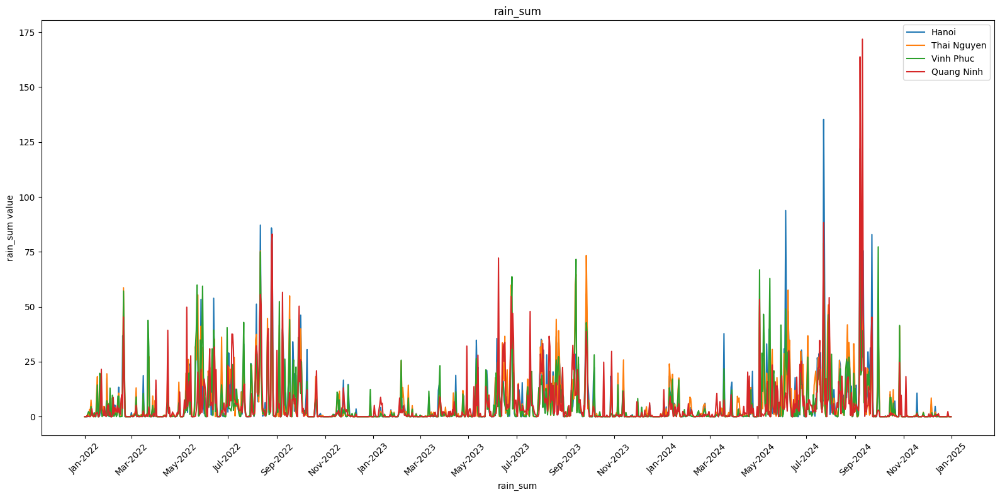

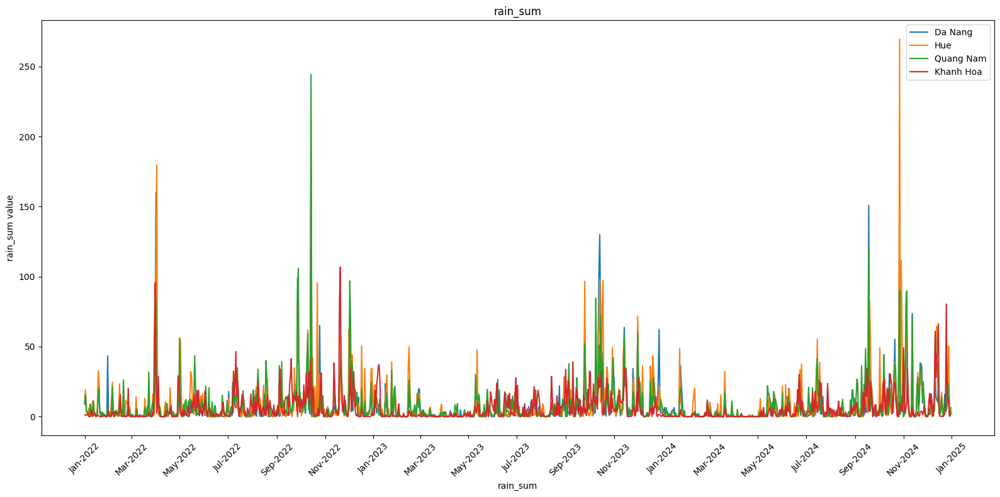

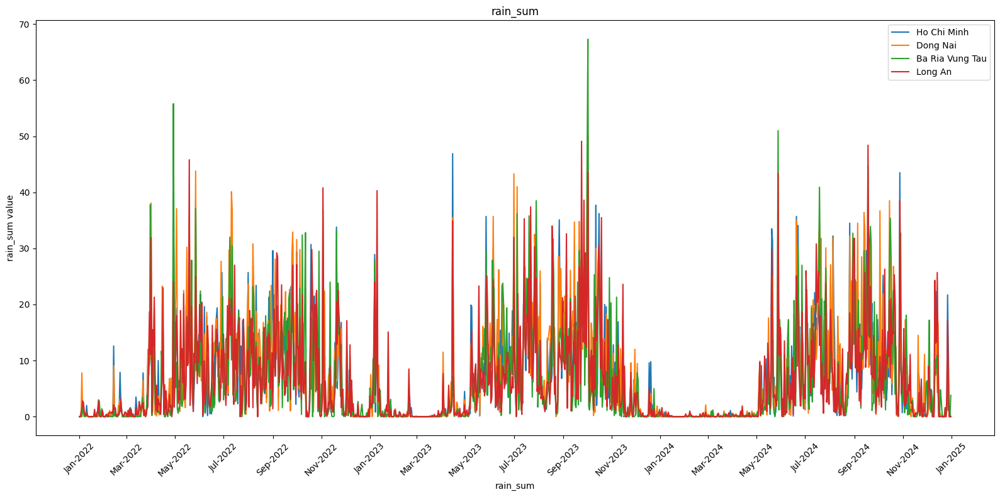

In [18]:
feature = ['rain_sum']
plot_region_data("North", north_cities, feature, fig=(16, 8))
plot_region_data("Central", central_cities, feature, fig=(16, 8))
plot_region_data("South", south_cities, feature, fig=(16, 8))

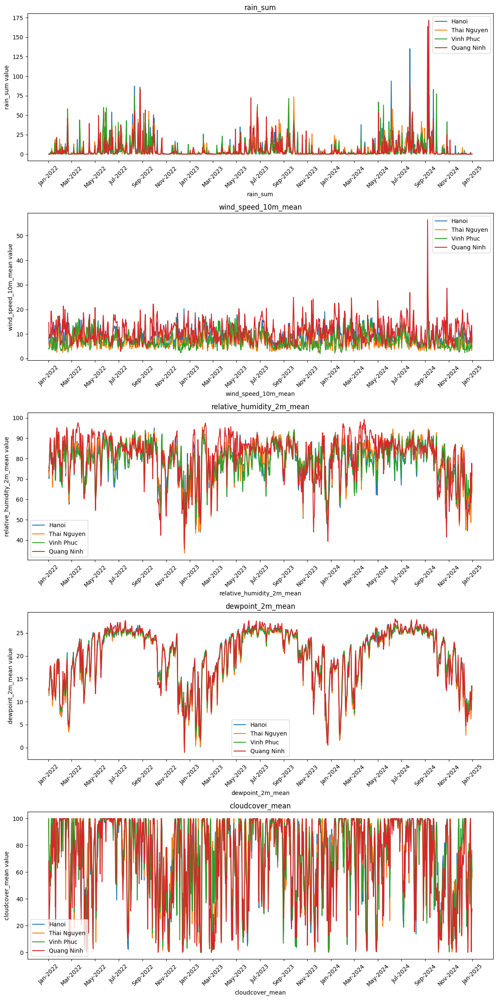

In [19]:
feature = ['rain_sum', 'wind_speed_10m_mean', 'relative_humidity_2m_mean', 'dewpoint_2m_mean', 'cloudcover_mean']
plot_region_data("North", north_cities, feature)

2. Central City 

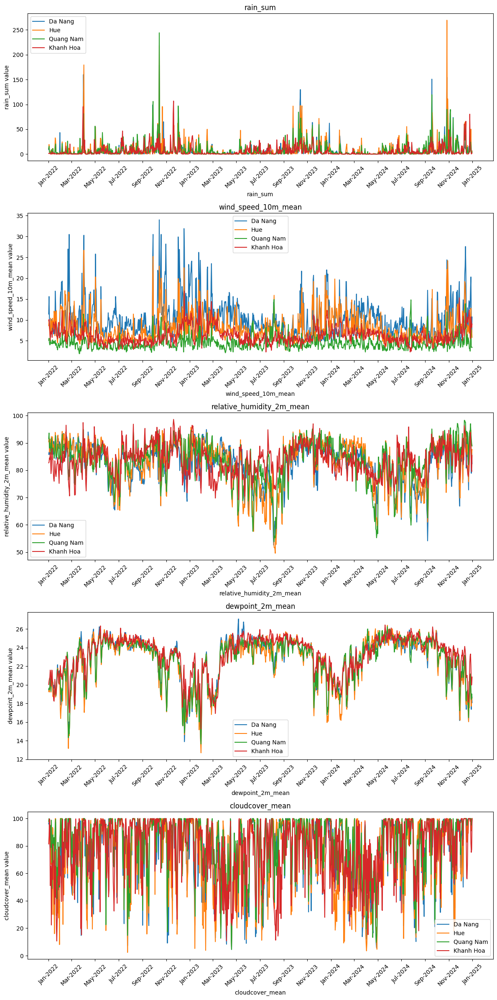

In [20]:
feature = ['rain_sum', 'wind_speed_10m_mean', 'relative_humidity_2m_mean', 'dewpoint_2m_mean', 'cloudcover_mean']
plot_region_data("Central", central_cities, feature)

3. South City

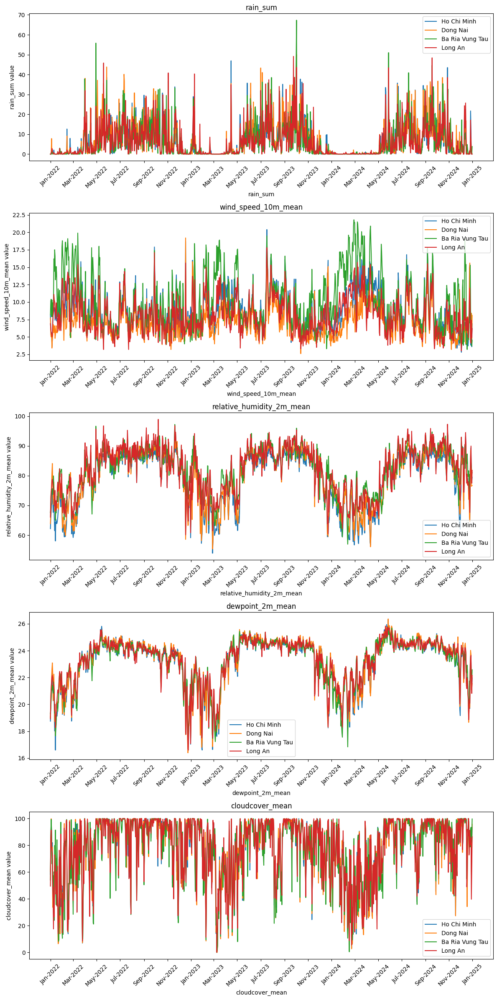

In [21]:
plot_region_data("South", south_cities, feature)

Dễ dàng thấy dewpoint và relative humidity đồng biến với các giá trị rain sum => có tác động hoặc có giá trị để predict value mưa trong khi độ che phủ của mây ko nói lên được gì 

# Encode

In [22]:
col = df.dtypes == 'object'
col = df.columns[col]
col

Index(['city', 'sunrise', 'sunset'], dtype='object')

In [23]:
df['city']

0          Hanoi
1          Hanoi
2          Hanoi
3          Hanoi
4          Hanoi
          ...   
13147    Long An
13148    Long An
13149    Long An
13150    Long An
13151    Long An
Name: city, Length: 13152, dtype: object

## Drop city vì có tọa độ

In [ ]:
# from sklearn.preprocessing import OneHotEncoder
# # encoder = OneHotEncoder(sparse_output=False)
# # data_city = pd.DataFrame(df['city'])
# # encode_data = encoder.fit_transform(data_city)
# # df_encode = pd.DataFrame(encode_data, columns=encoder.get_feature_names_out(['city']))
# # df_encode = pd.concat([df, df_encode], axis=1)
# # df_encode

,city,latitude,longitude,date,temperature_2m_max,temperature_2m_min,temperature_2m_mean,rain_sum,precipitation_hours,weather_code,...,city_Dong Nai,city_Hanoi,city_Ho Chi Minh,city_Hue,city_Khanh Hoa,city_Long An,city_Quang Nam,city_Quang Ninh,city_Thai Nguyen,city_Vinh Phuc
0,Hanoi,21.0278,105.8342,2022-01-01,20.7,13.9,16.9,0.0,0.0,0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Hanoi,21.0278,105.8342,2022-01-02,21.6,14.9,17.2,0.0,0.0,0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Hanoi,21.0278,105.8342,2022-01-03,21.8,12.9,17.6,0.0,0.0,0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Hanoi,21.0278,105.8342,2022-01-04,23.9,13.4,18.2,0.0,0.0,0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Hanoi,21.0278,105.8342,2022-01-05,24.0,17.0,19.8,0.0,0.0,0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13147,Long An,10.5336,106.4110,2024-12-27,30.7,23.4,26.1,17.1,5.0,2,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
13148,Long An,10.5336,106.4110,2024-12-28,29.9,23.0,25.6,6.3,7.0,2,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
13149,Long An,10.5336,106.4110,2024-12-29,29.9,21.5,25.4,0.0,0.0,0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
13150,Long An,10.5336,106.4110,2024-12-30,30.3,20.4,25.3,0.0,0.0,0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [25]:
df_encode['sunrise'] = pd.to_datetime(df_encode['sunrise']).dt.time
df_encode['sunset'] = pd.to_datetime(df_encode['sunset']).dt.time
df_encode

,city,latitude,longitude,date,temperature_2m_max,temperature_2m_min,temperature_2m_mean,rain_sum,precipitation_hours,weather_code,...,city_Dong Nai,city_Hanoi,city_Ho Chi Minh,city_Hue,city_Khanh Hoa,city_Long An,city_Quang Nam,city_Quang Ninh,city_Thai Nguyen,city_Vinh Phuc
0,Hanoi,21.0278,105.8342,2022-01-01,20.7,13.9,16.9,0.0,0.0,0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Hanoi,21.0278,105.8342,2022-01-02,21.6,14.9,17.2,0.0,0.0,0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Hanoi,21.0278,105.8342,2022-01-03,21.8,12.9,17.6,0.0,0.0,0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Hanoi,21.0278,105.8342,2022-01-04,23.9,13.4,18.2,0.0,0.0,0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Hanoi,21.0278,105.8342,2022-01-05,24.0,17.0,19.8,0.0,0.0,0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13147,Long An,10.5336,106.4110,2024-12-27,30.7,23.4,26.1,17.1,5.0,2,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
13148,Long An,10.5336,106.4110,2024-12-28,29.9,23.0,25.6,6.3,7.0,2,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
13149,Long An,10.5336,106.4110,2024-12-29,29.9,21.5,25.4,0.0,0.0,0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
13150,Long An,10.5336,106.4110,2024-12-30,30.3,20.4,25.3,0.0,0.0,0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [26]:
col_int = df_encode.dtypes == 'int64'
col_int = df_encode.columns[col_int]
df_encode[col_int] = df_encode[col_int].astype('float64')

In [27]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()
z_scaler = StandardScaler()
df_col = df_encode.copy()
df_col = df_col.drop(columns=['latitude', 'longitude', 'weather_code'])

col_nums = df_encode.dtypes == 'float64'
col_nums.loc[['latitude', 'longitude', 'weather_code']] = False
col_nums = df_encode.columns[col_nums]
col_nums = col_nums[:-12]

df_scaler = df_encode.copy()
df_scaler[col_nums] = z_scaler.fit_transform(df_scaler[col_nums])

col_nums


Index(['temperature_2m_max', 'temperature_2m_min', 'temperature_2m_mean',
       'rain_sum', 'precipitation_hours', 'sunshine_duration',
       'daylight_duration', 'wind_speed_10m_max', 'wind_speed_10m_mean',
       'wind_gusts_10m_max', 'wind_direction_10m_dominant',
       'shortwave_radiation_sum', 'relative_humidity_2m_max',
       'relative_humidity_2m_min', 'relative_humidity_2m_mean',
       'dewpoint_2m_max', 'dewpoint_2m_min', 'dewpoint_2m_mean',
       'surface_pressure_mean', 'cloudcover_mean'],
      dtype='object')

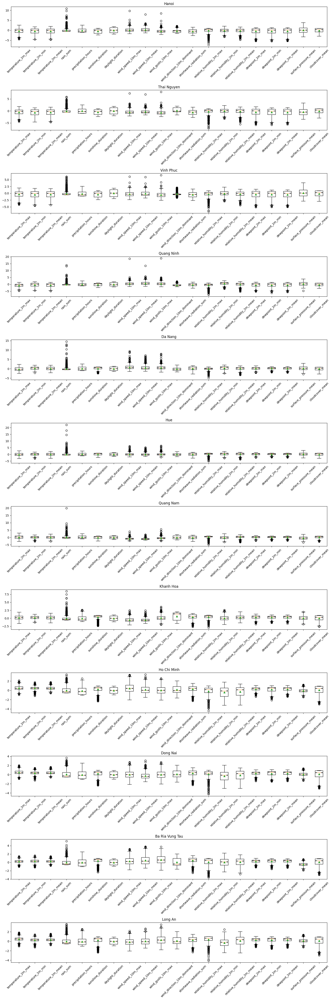

In [28]:
plt.figure(figsize=(16, 48))
for index, city in enumerate(cities):
    plt.subplot(len(cities), 1, index + 1)
    data = df_scaler[df_scaler['city'] == city][col_nums]
    plt.boxplot([data[c] for c in col_nums], tick_labels=col_nums, showmeans=True, notch=True)
    plt.title(city)
    plt.xticks(rotation=45)
    plt.tight_layout()

### Handle Outlier

In [29]:
outlier = ['temperature_2m_max', 'temperature_2m_min', 'temperature_2m_mean',
           'rain_sum', 'precipitation_hours', 'sunshine_duration',
           'wind_speed_10m_max', 'wind_speed_10m_mean', 'wind_gusts_10m_max', 'shortwave_radiation_sum',
           'relative_humidity_2m_max', 'relative_humidity_2m_min', 'relative_humidity_2m_mean',
           'dewpoint_2m_max', 'dewpoint_2m_min', 'dewpoint_2m_mean',
           'surface_pressure_mean', 'cloudcover_mean']


for col in outlier:
    Q1 = df_encode[col].quantile(0.25)
    Q3 = df_encode[col].quantile(0.75)
    IQR = Q3 - Q1
    mask_below_q1 = df_encode[col] < (Q1 - 1.5 * IQR)
    mask_above_q3 = df_encode[col] > (Q3 + 1.5 * IQR)
    df_encode.loc[mask_below_q1, col] = Q1 - 1.5 * IQR
    df_encode.loc[mask_above_q3, col] = Q3 + 1.5 * IQR

df_encode[col_nums] = scaler.fit_transform(df_encode[col_nums])

for index, city in enumerate(cities):
    df_city = df_encode['city'] == city
    df_encode.loc[df_city, outlier] = df_encode.loc[df_city, outlier].rolling(window=7, min_periods=1).mean()

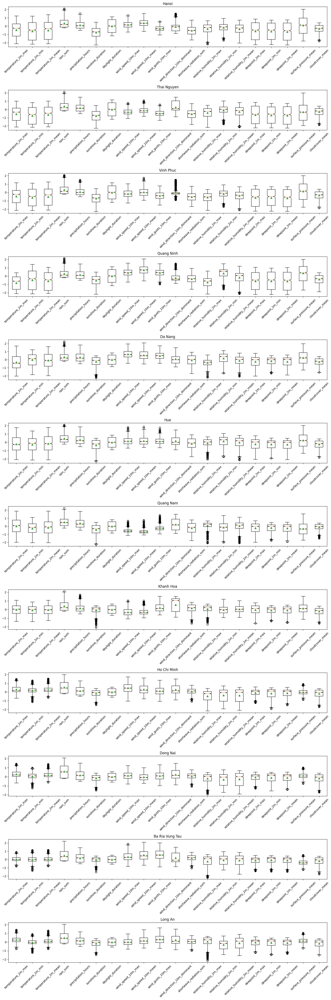

In [30]:
plt.figure(figsize=(16, 48))
for index, city in enumerate(cities):
    plt.subplot(len(cities), 1, index + 1)
    data = df_encode[df_encode['city'] == city][col_nums]
    plt.boxplot([data[c] for c in col_nums], tick_labels=col_nums, showmeans=True, notch=True)
    plt.title(city)
    plt.xticks(rotation=45)
    plt.tight_layout()

### Feature Extraction

In [31]:
# Thay đổi các giá trị date thành ngày tháng năm
df_feature = df_encode.copy()
df_feature['year'] = df_feature['date'].dt.year
df_feature['month'] = df_feature['date'].dt.month
df_feature['day'] = df_feature['date'].dt.day
df_feature['dayofweek'] = df_feature['date'].dt.dayofweek
df_feature['quarter'] = df_feature['date'].dt.quarter
df_feature['dayinmonth'] = df_feature['date'].dt.days_in_month
# df_feature = df_feature.drop(columns=['date'])

In [32]:
# Kỹ thuật Cyclical Feature Encoding
month_max = 12
week_day_max = 7
df_feature['month_sin'] = np.sin(2 * np.pi * df_feature['month'] / month_max)
df_feature['month_cos'] = np.cos(2 * np.pi * df_feature['month'] / month_max)
df_feature['day_sin'] = np.sin(2 * np.pi * df_feature['day'] / df_feature['dayinmonth'])
df_feature['day_cos'] = np.cos(2 * np.pi * df_feature['day'] / df_feature['dayinmonth'])
df_feature['dayofweek_sin'] = np.sin(2 * np.pi * df_feature['dayofweek'] / week_day_max)
df_feature['dayofweek_cos'] = np.cos(2 * np.pi * df_feature['dayofweek'] / week_day_max)
df_feature['quarter_sin'] = np.sin(2 * np.pi * df_feature['quarter'] / 4)
df_feature['quarter_cos'] = np.cos(2 * np.pi * df_feature['quarter'] / 4)

In [33]:
df_cycling = df_feature.drop(columns=['month', 'day', 'dayofweek', 'quarter', 'dayinmonth'])
df_cycling

,city,latitude,longitude,date,temperature_2m_max,temperature_2m_min,temperature_2m_mean,rain_sum,precipitation_hours,weather_code,...,city_Vinh Phuc,year,month_sin,month_cos,day_sin,day_cos,dayofweek_sin,dayofweek_cos,quarter_sin,quarter_cos
0,Hanoi,21.0278,105.8342,2022-01-01,-2.106383,-2.147059,-2.100000,-0.207317,-0.500000,0.0,...,0.0,2022,5.000000e-01,0.866025,2.012985e-01,0.979530,-0.974928,-0.222521,1.000000e+00,6.123234e-17
1,Hanoi,21.0278,105.8342,2022-01-02,-2.010638,-2.147059,-2.100000,-0.207317,-0.500000,0.0,...,0.0,2022,5.000000e-01,0.866025,3.943559e-01,0.918958,-0.781831,0.623490,1.000000e+00,6.123234e-17
2,Hanoi,21.0278,105.8342,2022-01-03,-1.964539,-2.147059,-2.100000,-0.207317,-0.500000,0.0,...,0.0,2022,5.000000e-01,0.866025,5.712682e-01,0.820763,0.000000,1.000000,1.000000e+00,6.123234e-17
3,Hanoi,21.0278,105.8342,2022-01-04,-1.829787,-2.147059,-2.100000,-0.207317,-0.500000,0.0,...,0.0,2022,5.000000e-01,0.866025,7.247928e-01,0.688967,0.781831,0.623490,1.000000e+00,6.123234e-17
4,Hanoi,21.0278,105.8342,2022-01-05,-1.744681,-2.123529,-2.068571,-0.207317,-0.500000,0.0,...,0.0,2022,5.000000e-01,0.866025,8.486443e-01,0.528964,0.974928,-0.222521,1.000000e+00,6.123234e-17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13147,Long An,10.5336,106.4110,2024-12-27,-0.246201,-0.621849,-0.355102,0.179443,-0.228571,2.0,...,0.0,2024,-2.449294e-16,1.000000,-7.247928e-01,0.688967,-0.433884,-0.900969,-2.449294e-16,1.000000e+00
13148,Long An,10.5336,106.4110,2024-12-28,-0.234043,-0.491597,-0.318367,0.289199,-0.128571,2.0,...,0.0,2024,-2.449294e-16,1.000000,-5.712682e-01,0.820763,-0.974928,-0.222521,-2.449294e-16,1.000000e+00
13149,Long An,10.5336,106.4110,2024-12-29,-0.139818,-0.432773,-0.232653,0.289199,-0.128571,0.0,...,0.0,2024,-2.449294e-16,1.000000,-3.943559e-01,0.918958,-0.781831,0.623490,-2.449294e-16,1.000000e+00
13150,Long An,10.5336,106.4110,2024-12-30,-0.133739,-0.386555,-0.204082,0.289199,-0.128571,0.0,...,0.0,2024,-2.449294e-16,1.000000,-2.012985e-01,0.979530,0.000000,1.000000,-2.449294e-16,1.000000e+00


## Ở đây lựa chọn z-score dựa vào lựa chọn mô hình 
- Với mô hình hồi quy như SVM, NN hoạt động tốt với PP chuẩn 
- Các mô hình tree-based ko bị ảnh hưởng thì ko cần 

In [34]:

scaler = StandardScaler()
df_cycling[col_nums] = scaler.fit_transform(df_cycling[col_nums])

In [35]:
data_vungmien['North'] = df_feature[df_feature['city'].isin(north_cities)]
data_vungmien['Central'] = df_feature[df_feature['city'].isin(central_cities)]
data_vungmien['South'] = df_feature[df_feature['city'].isin(south_cities)]

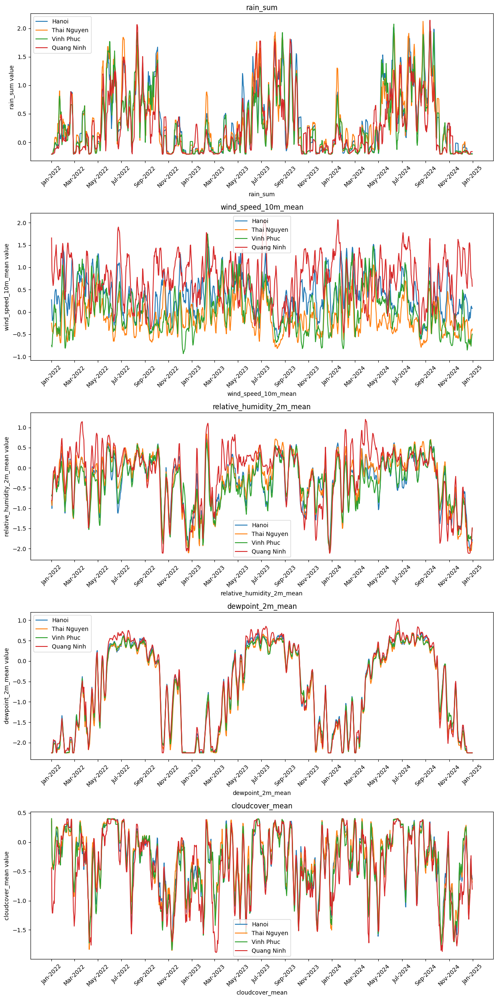

In [36]:
plot_region_data("North", north_cities, feature)


In [37]:
col_nums

Index(['temperature_2m_max', 'temperature_2m_min', 'temperature_2m_mean',
       'rain_sum', 'precipitation_hours', 'sunshine_duration',
       'daylight_duration', 'wind_speed_10m_max', 'wind_speed_10m_mean',
       'wind_gusts_10m_max', 'wind_direction_10m_dominant',
       'shortwave_radiation_sum', 'relative_humidity_2m_max',
       'relative_humidity_2m_min', 'relative_humidity_2m_mean',
       'dewpoint_2m_max', 'dewpoint_2m_min', 'dewpoint_2m_mean',
       'surface_pressure_mean', 'cloudcover_mean'],
      dtype='object')

C:\Users\buiti\AppData\Local\Temp\ipykernel_22620\1908113111.py:5: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()
C:\Users\buiti\AppData\Local\Temp\ipykernel_22620\1908113111.py:5: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()
C:\Users\buiti\AppData\Local\Temp\ipykernel_22620\1908113111.py:5: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()
C:\Users\buiti\AppData\Local\Temp\ipykernel_22620\1908113111.py:5: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()
C:\Users\buiti\AppData\Local\Temp\ipykernel_22620\1908113111.py:5: UserWarning: Tight layout not applied. tight_layout cannot make Axes height s

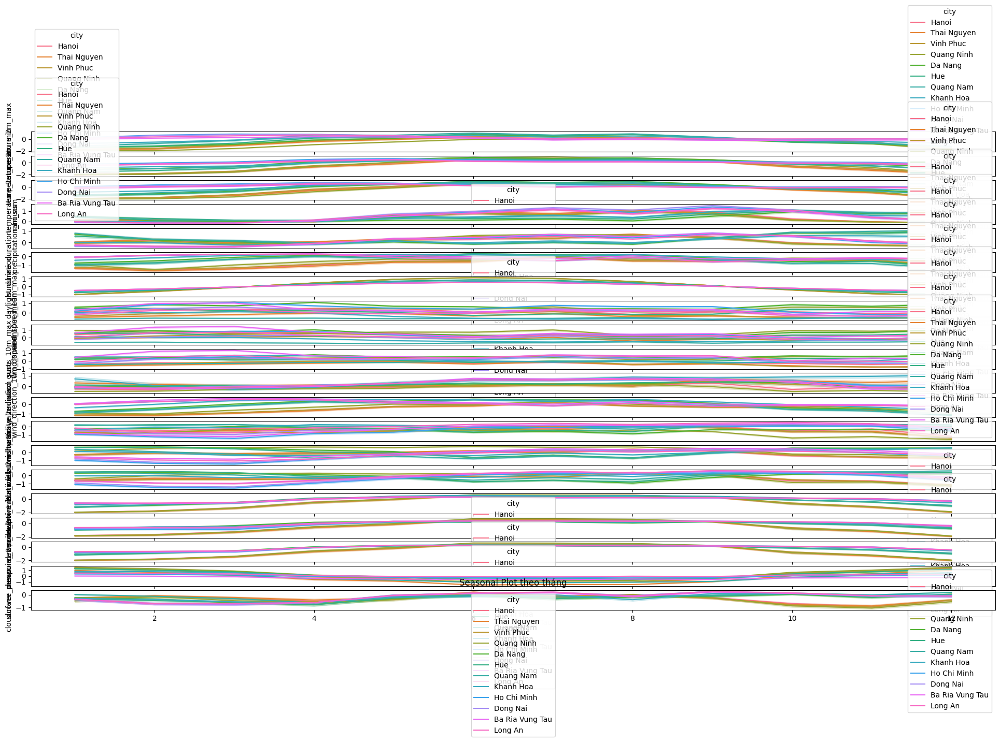

In [38]:
plt.figure(figsize=(24, 12))
for index, col in enumerate(col_nums):
    plt.subplot(len(col_nums), 1, index + 1)
    sns.lineplot(data=df_feature, x='month', y=col, hue='city')
    plt.tight_layout()
plt.title("Seasonal Plot theo tháng")
plt.show()

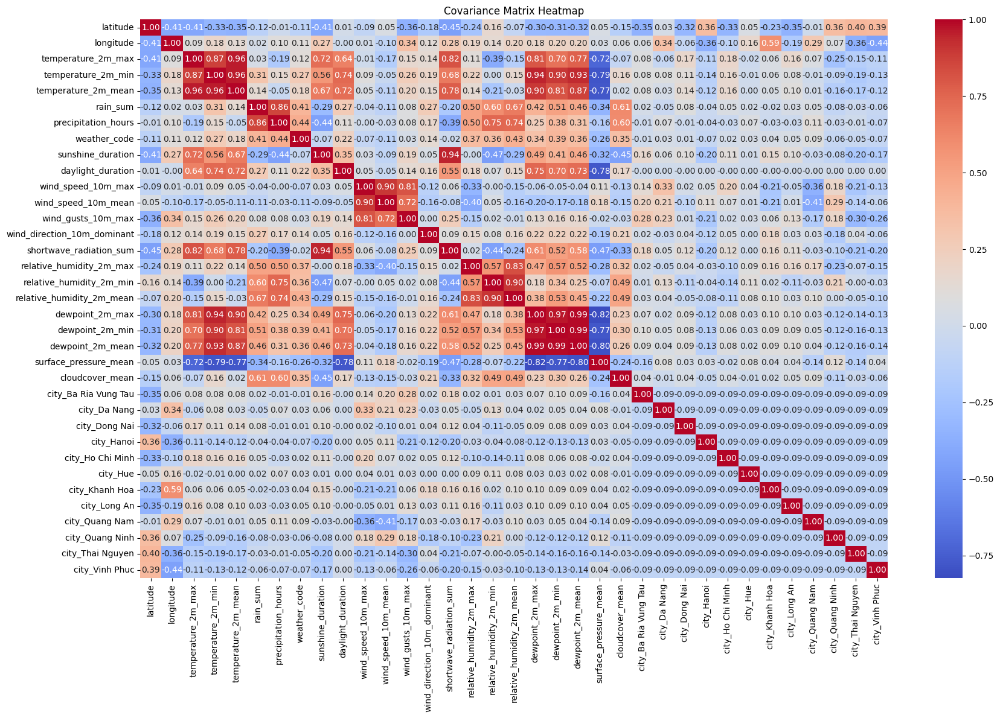

In [39]:
numeric_cols = df_encode.select_dtypes(include='number').columns
cov_matrix = df_encode[numeric_cols].corr()

plt.figure(figsize=(18, 12))
sns.heatmap(cov_matrix, annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Covariance Matrix Heatmap")
plt.tight_layout()
plt.show()


# Experimental Evaluation

In [40]:
df_cycling.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13152 entries, 0 to 13151
Data columns (total 48 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   city                         13152 non-null  object        
 1   latitude                     13152 non-null  float64       
 2   longitude                    13152 non-null  float64       
 3   date                         13152 non-null  datetime64[ns]
 4   temperature_2m_max           13152 non-null  float64       
 5   temperature_2m_min           13152 non-null  float64       
 6   temperature_2m_mean          13152 non-null  float64       
 7   rain_sum                     13152 non-null  float64       
 8   precipitation_hours          13152 non-null  float64       
 9   weather_code                 13152 non-null  float64       
 10  sunrise                      13152 non-null  object        
 11  sunset                       13152 non-nu

In [41]:
df_copy = df_cycling.copy()
df_copy = df_copy.drop(columns=['sunrise', 'sunset', 'date'])

## 3) Tách tập theo thời gian: train ≤ 2023-12-31, test ≥ 2024-01-01 (fallback nếu thiếu 2024)

In [42]:
# === [NEW] Time-based split ===
year = 2024
df_train = df_copy[df_copy['year'] < year].reset_index(drop=True)
df_test  = df_copy[df_copy['year'] >= year].reset_index(drop=True)

In [43]:
df_train['year'].unique(), df_test['year'].unique()

(array([2022, 2023]), array([2024]))

## 4) Cross-validation theo city (GroupKFold) trên tập train + GridSearch cho Logistic & RandomForest

In [44]:
groups_train = df_train['city']

df_train.drop(columns=['city'], inplace=True)
df_test.drop(columns=['city'], inplace=True)

X_train = df_train.drop(columns=['weather_code'])
Y_train = df_train['weather_code']
X_test = df_test.drop(columns=['weather_code'])
Y_test = df_test['weather_code']


X_train.shape, Y_train.shape, X_test.shape, Y_test.shape

((8760, 43), (8760,), (4392, 43), (4392,))

In [45]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 44 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   latitude                     8760 non-null   float64
 1   longitude                    8760 non-null   float64
 2   temperature_2m_max           8760 non-null   float64
 3   temperature_2m_min           8760 non-null   float64
 4   temperature_2m_mean          8760 non-null   float64
 5   rain_sum                     8760 non-null   float64
 6   precipitation_hours          8760 non-null   float64
 7   weather_code                 8760 non-null   float64
 8   sunshine_duration            8760 non-null   float64
 9   daylight_duration            8760 non-null   float64
 10  wind_speed_10m_max           8760 non-null   float64
 11  wind_speed_10m_mean          8760 non-null   float64
 12  wind_gusts_10m_max           8760 non-null   float64
 13  wind_direction_10m

In [46]:
Y_train.value_counts()

weather_code
2.0    6789
0.0    1971
Name: count, dtype: int64

In [47]:
# === [NEW] Model selection with GroupKFold ===
from sklearn.model_selection import GroupKFold, GridSearchCV, TimeSeriesSplit
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (roc_auc_score, average_precision_score, 
                             f1_score, precision_score, recall_score, 
                             balanced_accuracy_score, brier_score_loss, classification_report)

import numpy as np

cv = GroupKFold(n_splits=5)

models_and_params = [
    (
        LogisticRegression(max_iter=2000, n_jobs=None, class_weight='balanced', 
                          solver='saga', random_state=42),
        {"C": [0.1, 0.5, 1.0, 2.0], "penalty": ["l1","l2"]}
    ),
    (
        RandomForestClassifier(class_weight='balanced', n_jobs=-1, random_state=42),
        {"n_estimators": [300, 600],
         "max_depth": [None, 10, 20],
         "min_samples_leaf": [1, 3]}
    )
]

def run_search(X, y, groups, model, grid, scoring='f1_weighted'):
    gs = GridSearchCV(model, grid, cv=cv, scoring=scoring, n_jobs=-1, refit=True, verbose=1)
    gs.fit(X, y, groups=groups)
    return gs

search_results = {}
best_models = {}

print("Bắt đầu huấn luyện mô hình...\n")

for mdl, grid in models_and_params:
    key = f"weather_code::{mdl.__class__.__name__}"
    
    print(f"Đang train {mdl.__class__.__name__}...")
    
    gs = run_search(X_train, Y_train, groups_train, mdl, grid)
    
    best_model = gs.best_estimator_
    
    y_pred = best_model.predict(X_test)
    y_pred_proba = best_model.predict_proba(X_test)
    
    test_f1 = f1_score(Y_test, y_pred, average='weighted')
    
    # Các metrics khác
    class_report = classification_report(Y_test, y_pred)
    test_precision = precision_score(Y_test, y_pred, average='weighted', zero_division=0)
    test_recall = recall_score(Y_test, y_pred, average='weighted')
    test_balanced_acc = balanced_accuracy_score(Y_test, y_pred)
    test_auc = roc_auc_score(Y_test, y_pred, multi_class='ovr', average='weighted')

    
    best_models[key] = best_model
    
    search_results[key] = {
        "best_score_F1": gs.best_score_,
        "best_params": gs.best_params_,
        "estimator": best_model,
        "test_F1": test_f1,
        "test_precision": test_precision,
        "test_recall": test_recall,
        "test_balanced_acc": test_balanced_acc,
        "test_AUC": test_auc,
        
    }
    
    print(class_report)
    print(f"  Test AUC: {test_auc:.4f}")
    print(f"  Best params: {gs.best_params_}\n")
    print(f"  Test Balanced Acc: {test_balanced_acc:.4f}")

# Tóm tắt kết quả search
print("="*70)
print("TÓM TẮT KẾT QUẢ")
print("="*70)
for k, v in search_results.items():
    print(f"{k}")
    print(f"  CV_F1={v['best_score_F1']:.4f} | Test_F1={v['test_F1']:.4f}")
    print(f"  Params: {v['best_params']}\n")

Bắt đầu huấn luyện mô hình...

Đang train LogisticRegression...
Fitting 5 folds for each of 8 candidates, totalling 40 fits


C:\Users\buiti\AppData\Roaming\Python\Python312\site-packages\sklearn\linear_model\_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


              precision    recall  f1-score   support

         0.0       0.50      0.77      0.61      1151
         2.0       0.90      0.73      0.81      3241

    accuracy                           0.74      4392
   macro avg       0.70      0.75      0.71      4392
weighted avg       0.80      0.74      0.76      4392

  Test AUC: 0.7512
  Best params: {'C': 0.1, 'penalty': 'l2'}

  Test Balanced Acc: 0.7512
Đang train RandomForestClassifier...
Fitting 5 folds for each of 12 candidates, totalling 60 fits
              precision    recall  f1-score   support

         0.0       0.68      0.54      0.60      1151
         2.0       0.85      0.91      0.88      3241

    accuracy                           0.81      4392
   macro avg       0.77      0.73      0.74      4392
weighted avg       0.80      0.81      0.81      4392

  Test AUC: 0.7267
  Best params: {'max_depth': 20, 'min_samples_leaf': 3, 'n_estimators': 300}

  Test Balanced Acc: 0.7267
TÓM TẮT KẾT QUẢ
weather_code::Lo

In [48]:
logis_coef = best_models["weather_code::LogisticRegression"].coef_
feature_names = X_train.columns
coef_df = pd.DataFrame(logis_coef.T, index=feature_names, columns=['value'])
coef_df = coef_df.sort_values(by='value', ascending=False)
coef_df

,value
precipitation_hours,0.470320
rain_sum,0.323161
relative_humidity_2m_mean,0.168768
cloudcover_mean,0.130437
dewpoint_2m_min,0.125701
relative_humidity_2m_min,0.107697
relative_humidity_2m_max,0.104607
dewpoint_2m_mean,0.092187
temperature_2m_min,0.084655
dewpoint_2m_max,0.061669


# Kết luận

### 1) Chất lượng & cấu trúc dữ liệu (những điểm rất tốt)

Không thiếu dữ liệu: Tỷ lệ NA ~ 0% ở các cột chính → rất thuận lợi cho huấn luyện (giảm nhu cầu imputation).

Không trùng lặp theo (city, date): dữ liệu sạch, mỗi dòng ~1 quan sát/ngày/địa điểm.

Phủ không gian & thời gian hợp lý: 12 city, vĩ độ ~10.5–21.6, kinh độ ~105.6–109.1; thời gian liên tục từ 2022-01-01 đến 2024-12-31 (không đứt gãy).

Giá trị vật lý hợp lý:

temperature_2m_max tới ~42.6°C (có thể xảy ra ở VN các đợt nắng nóng).

rain_sum tối đa ~269.5 mm/ngày (mưa rất lớn, phù hợp miền Trung/mùa mưa).

surface_pressure_mean ~983–1029 hPa; cloudcover_mean, RH (0–100%).

sunshine_duration/daylight_duration theo giây, mức ~10–13.5 giờ/ngày → hợp lý.

Cảnh báo đơn vị gió (cần ghi rõ trong báo cáo): các dải wind_speed_10m_max/mean và đặc biệt wind_gusts_10m_max trông giống km/h hơn là m/s (ví dụ P95 gust ≈ 45 “đơn vị” → 45 m/s là quá lớn, nhưng 45 km/h thì hợp lý; max gust ~188.6 càng củng cố giả thiết km/h). Bạn đã chuẩn hóa theo phân vị (P95) để gắn nhãn nên mô hình vẫn ổn, nhưng nên quy ước/đổi đơn vị rõ ràng (km/h ↔ m/s) để tránh hiểu lầm.

### 2) Định nghĩa nhãn cực đoan & hệ quả

Bạn gắn nhãn theo phân vị P95 từng city cho ít nhất 3 hiện tượng: mưa lớn (rain_sum), nắng nóng (temperature_2m_max), gió giật (wind_gusts_10m_max).

Ưu điểm: thích ứng phân bố cục bộ mỗi city (HCM ít mưa cực đoan hơn Huế, chẳng hạn).

Nhược điểm: P95 là định nghĩa tương đối — sự kiện “cực đoan” ở city khô ráo có thể nhỏ hơn nhiều so với city mưa nhiều. Nếu mục tiêu vận hành là rủi ro thực (ngập lụt, gió giật nguy hiểm…), bạn nên bổ sung nhãn domain-fixed (ví dụ mưa ≥ 50/100 mm, gust ≥ 74 km/h, tmax ≥ 37°C) để so sánh (làm baseline rule-based).

Khuyến nghị: báo cáo cả hai kiểu nhãn (P95 và domain-fixed). Như vậy bạn vừa có mô hình thích ứng từng city, vừa có chuẩn an toàn để ra quyết định thực tế.

### 3) Mất cân bằng lớp (class imbalance) là bản chất bài toán

P95 ⇒ khoảng 5% dương tính mỗi city; domain-fixed thường còn mất cân bằng hơn.

Điều này giải thích vì sao trong Experimental Evaluation nên dùng Average Precision (PR-AUC), Recall, Brier score, Calibration; và nên dùng class_weight='balanced' / scale_pos_weight hoặc các kỹ thuật sampling (chỉ trên train).

Gợi ý bổ sung: báo cáo Precision/Recall tại các ngưỡng vận hành (vd. chọn Recall ≥ 0.80 để giảm bỏ sót) — đây là phần “decision policy” quan trọng cho cảnh báo.

### 4) Đặc trưng có khả năng ảnh hưởng mạnh đến dự đoán cực đoan (và vì sao)

Dựa trên trực giác vật lý + những tương quan mình thấy trong heatmap và tính chất khí tượng, đây là các nhóm feature có giải thích cơ chế:

Tiền sử gần (lags/rolling):

Mưa lớn thường liên quan đến chuỗi ngày ẩm và hội tụ ẩm: rain_sum_lag1/3/7, relative_humidity_2m_mean_lag*, precipitation_hours_rolling*.

Nắng nóng: temperature_2m_max_lag1/3, shortwave_radiation_sum và cloudcover_mean (nắng cao ↔ mây thấp).

Gió giật: wind_speed_10m_mean/max_lag*, pressure biến thiên nhanh (gradient), weather_code (bão/giông).
→ Nếu bạn chưa thêm lags/rolling vào X, hãy bổ sung: chúng thường tăng khả năng dự báo đáng kể.

Thời vụ/chu kỳ:

month, day_of_year (kèm sin/cos) thể hiện rõ mùa mưa và mùa khô, mùa nắng nóng. Ở VN, mùa mưa miền Nam (khoảng 5–10), bão/áp thấp nhiệt đới thường tập trung cuối mùa hè–đầu thu ở miền Trung/Bắc.

Gợi ý: thêm sin/cos(2π·month/12), sin/cos(2π·doy/365) vào X.

Vị trí địa lý:

latitude/longitude đã có — tốt. Có thể tạo biến “vùng” (Bắc/Trung/Nam) hoặc khoảng cách tới biển (gió/mưa ven biển khác so với nội lục).

Địa hình (độ cao) nếu có sẽ rất hữu ích cho mưa cực đoan (sườn núi, đón gió).

Các biến vật lý gắn trực tiếp với cơ chế cực đoan:

Mưa cực đoan: relative_humidity_2m_mean (độ ẩm cao), precipitation_hours, cloudcover_mean (cao), shortwave_radiation_sum (thấp), đột biến gió/gust trước sự kiện, weather_code (bão/giông).

Nắng nóng: shortwave_radiation_sum cao, cloudcover_mean thấp, dewpoint và RH có thể thấp (khô nóng) hoặc cao (oi bức) tùy vùng; lags nhiệt độ.

Gió giật: wind_gusts_10m_max lags, wind_speed_10m_mean/max, hướng gió trội wind_direction_10m_dominant (gió mùa/đông bắc), chênh áp (nếu có).

### 5) Các “bẫy” có thể làm suy giảm kết quả dự báo

Rò rỉ thời gian (temporal leakage): bất kỳ chuẩn hóa/scaler/encoder nào fit trên toàn bộ dữ liệu trước split đều làm CV/test lạc quan. Hãy đảm bảo fit scaler/encoder trên train (hoặc fit sẵn từ Preprocessing nhưng không nhìn vào test).

Đơn vị gió: nếu mô hình dùng ngưỡng domain-fixed cho gió (ví dụ m/s) nhưng dữ liệu là km/h ⇒ lệch ngưỡng; hãy chuẩn hóa đúng đơn vị hoặc đổi tên cột rõ ràng.

Nhãn P95 theo city: so sánh giữa các city trở nên khó hiểu (P95 của nơi “ít mưa” có thể là mưa vừa ở nơi “nhiều mưa”). Vì vậy, trong báo cáo hãy luôn kèm định nghĩa nhãn và cân nhắc thêm baseline domain-fixed.

Thiếu biến ngoại sinh: ENSO, MJO, chỉ số gió mùa, độ cao địa hình, khoảng cách tới biển, trường gió tầng cao… không có trong tập → mô hình có thể “mù” trước các pattern quy mô lớn. Với bài học thuật, bạn có thể thảo luận hạn chế này và đề xuất tích hợp reanalysis (ERA5) ở vòng sau.

Độ phân giải thời gian: dữ liệu theo ngày — nhưng nhiều hiện tượng cực đoan (dông lốc, mưa rào cục bộ) diễn ra dưới 24h. Vì thế, độ chính xác dự đoán có trần giới hạn; hãy nêu rõ phạm vi (daily extreme forecasting), tránh kì vọng “nowcasting”.

### 6) Đánh giá & vận hành (interpretation-ready)

Chỉ số nên ưu tiên:

PR-AUC (Average Precision) và Recall ở ngưỡng vận hành (ví dụ đạt Recall 0.80 với Precision bao nhiêu?).

Brier & Calibration: nếu đường calibration lệch nhiều, cân nhắc CalibratedClassifierCV (isotonic/Platt) để xác suất dự báo “đáng tin” hơn.

Chọn ngưỡng vận hành: cung cấp bảng Precision/Recall/F1 theo ngưỡng; đề xuất ngưỡng ưu tiên ít bỏ sót (Recall cao) cho cảnh báo thời tiết cực đoan, chấp nhận tăng FP ở mức có thể xử lý.

Slice analysis: trình bày kết quả theo city và mùa (ví dụ mùa mưa miền Nam 5–10, mùa bão miền Trung 8–11). Nếu chênh lệch lớn, cân nhắc mô hình theo vùng/season hoặc hiệu chỉnh ngưỡng theo mùa.

### 7) Kiến nghị nâng cấp (nếu có vòng 2)

Bổ sung lags/rolling có hệ thống (1/3/7 ngày) cho các trụ cột: mưa, RH, cloudcover, wind, radiation, tmax.

Mở rộng đặc trưng không gian: region (B/T/N), khoảng cách tới biển, độ cao.

Nhãn domain-fixed song song P95 để có baseline vận hành rõ ràng.

Hiệu chỉnh xác suất nếu Brier/cali xấu; bootstrap CI cho PR-AUC/F1 để có khoảng tin cậy.

Nếu cần độ chính xác cao hơn, xem xét nguồn tái phân tích ERA5 (gió ở nhiều mực, CAPE, PWAT, v.v.) hoặc dữ liệu radar/satellite (nếu bài toán cho phép).